In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import random
import math
import pandas as pd
import xgboost
import lightgbm
import catboost
import itertools

from os.path import join
from matplotlib.colors import ListedColormap
from scipy.stats import pearsonr
from itertools import combinations
from sklearn.base import BaseEstimator
from sklearn import datasets
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import (RandomForestClassifier,
                              ExtraTreesClassifier,
                              VotingClassifier)
from sklearn.tree import (DecisionTreeRegressor,
                          DecisionTreeClassifier)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

C:\Users\Комп\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
plt.rcParams["figure.figsize"] = 12, 9
sns.set_style("whitegrid")
warnings.filterwarnings("ignore")

SEED = 111
random.seed(SEED)
np.random.seed(SEED)
DATA_PATH = "data"

### Задание 1. Bias-variance trade-off

**2 балла**

Продемонстрируйте bias-variance trade-off для `DecisionTreeRegressor` при изменении глубины дерева. Постройте регрессионную модель функции от одной независимой переменной, представленной в ячейке ниже, используя функцию `plot_regression_predictions` (можете ее как-то поменять, если захочется). Попробуйте разные значения глубины деревьев, при каком значении, на ваш взгляд, модель оптимальна, при каком variance становится слишком большим?

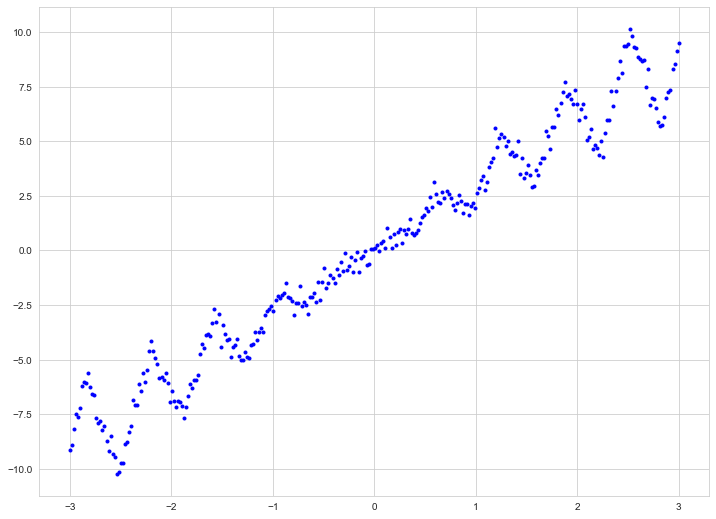

In [3]:
# Сгенерируем какую-нибудь необычную зависимость и научимся ее предсказывать
np.random.seed(42)
m = 300
X = np.linspace(-3, 3, m).reshape(-1, 1)
y = (3 + 2/np.pi * np.arcsin(np.cos(10 * X))) * X
y = y + np.random.randn(m, 1) / 3
plt.plot(X.reshape(-1), y.reshape(-1), "b.");

In [4]:
# Функция для отрисовки предсказаний деревьев решений в случае регрессии
def plot_regression_predictions(tree_reg, X, y, axes=[-3, 3, -10, 10], ylabel="$y$", linewidth=3):
    x1 = np.linspace(axes[0], axes[1], 500).reshape(-1, 1)
    y_pred = tree_reg.predict(x1)
    plt.axis(axes)
    #plt.xlabel("$x_1$", fontsize=18)
    #if ylabel:
        #plt.ylabel(ylabel, fontsize=18, rotation=0)
    
    plt.plot(X.reshape(-1), y.reshape(-1), "b.")
    plt.plot(x1, y_pred, linewidth=linewidth, label=r"$\hat{y}$", c = 'red')
    
    plt.xticks([], [])
    plt.yticks([], [])

Изобразите, как меняются предсказания дерева при увеличении максимальной глубины (можно взять что-то в диапазоне от 1 до 15):

In [2]:
## ENTER YOUR CODE HERE (/¯◡ ‿ ◡)/¯☆*##

Text(0.5, 1.0, 'max_depth=7')

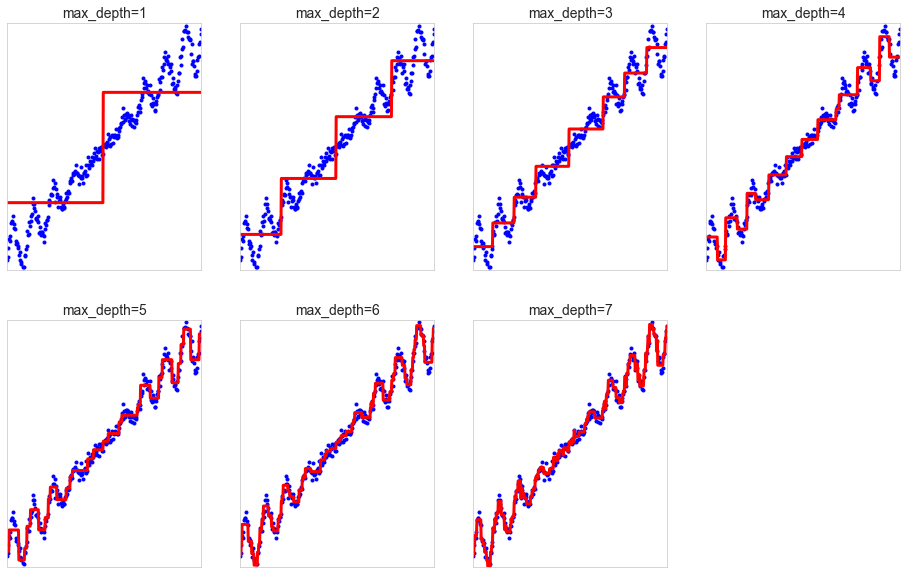

In [5]:
plt.figure(figsize=(16,10))
plt.subplot(241)
treeReg = DecisionTreeRegressor(max_depth=1).fit(X,y)
plot_regression_predictions(treeReg, X,y)
plt.title("max_depth=1", fontsize=14)
plt.subplot(242)
treeReg = DecisionTreeRegressor(max_depth=2).fit(X,y)
plot_regression_predictions(treeReg, X,y)
plt.title("max_depth=2", fontsize=14)
plt.subplot(243)
treeReg = DecisionTreeRegressor(max_depth=3).fit(X,y)
plot_regression_predictions(treeReg, X,y)
plt.title("max_depth=3", fontsize=14)
plt.subplot(244)
treeReg = DecisionTreeRegressor(max_depth=4).fit(X,y)
plot_regression_predictions(treeReg, X,y)
plt.title("max_depth=4", fontsize=14)
plt.subplot(245)
treeReg = DecisionTreeRegressor(max_depth=5).fit(X,y)
plot_regression_predictions(treeReg, X,y)
plt.title("max_depth=5", fontsize=14)
plt.subplot(246)
treeReg = DecisionTreeRegressor(max_depth=6).fit(X,y)
plot_regression_predictions(treeReg, X,y)
plt.title("max_depth=6", fontsize=14)
plt.subplot(247)
treeReg = DecisionTreeRegressor(max_depth=7).fit(X,y)
plot_regression_predictions(treeReg, X,y)
plt.title("max_depth=7", fontsize=14)



 Если посмотреть на графики, то на моменте max_depth=7 возможно и есть лучшая модель, а начиная с max_depth=8 модель становится слишком сложной и запоминает данные (см. ниже)

Text(0.5, 1.0, 'max_depth=10')

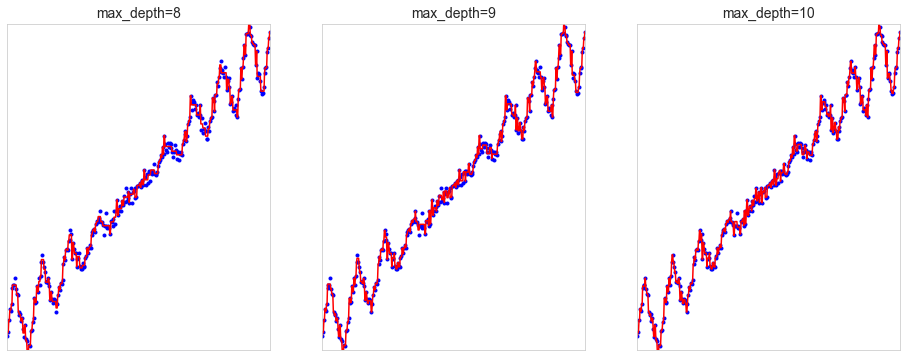

In [6]:
plt.figure(figsize=(16,6))

plt.subplot(131)
treeReg = DecisionTreeRegressor(max_depth=8).fit(X,y)
plot_regression_predictions(treeReg, X,y, linewidth=1.5)
plt.title("max_depth=8", fontsize=14)
plt.subplot(132)
treeReg = DecisionTreeRegressor(max_depth=9).fit(X,y)
plot_regression_predictions(treeReg, X,y, linewidth=1.5)
plt.title("max_depth=9", fontsize=14)
plt.subplot(133)
treeReg = DecisionTreeRegressor(max_depth=10).fit(X,y)
plot_regression_predictions(treeReg, X,y, linewidth=1.5)
plt.title("max_depth=10", fontsize=14)



Начиная с max_depth=10 кривая нарисованная с помощью модели почти полностью повторяет исходную кривую (наверно это означает, что тут имеет место высокий variance)


Text(0.5, 1.0, 'max_depth=15')

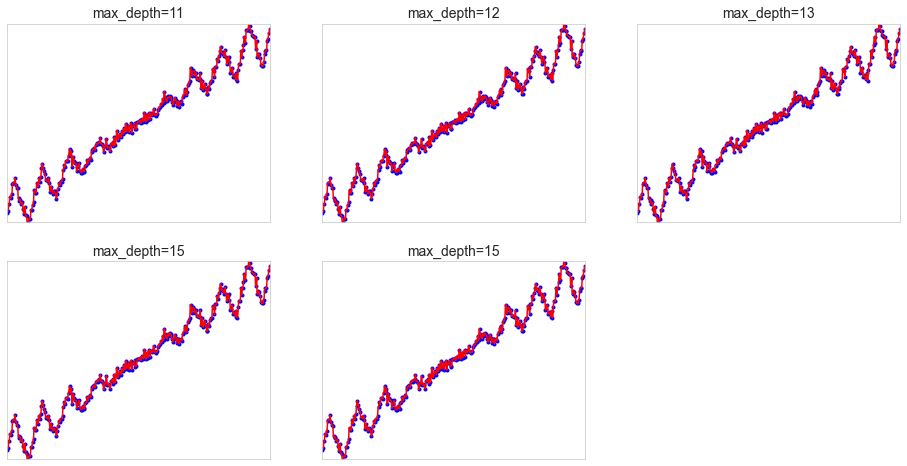

In [7]:
plt.figure(figsize=(16,8))

plt.subplot(231)
treeReg = DecisionTreeRegressor(max_depth=11).fit(X,y)
plot_regression_predictions(treeReg, X,y, linewidth=1.5)
plt.title("max_depth=11", fontsize=14)
plt.subplot(232)
treeReg = DecisionTreeRegressor(max_depth=12).fit(X,y)
plot_regression_predictions(treeReg, X,y, linewidth=1.5)
plt.title("max_depth=12", fontsize=14)
plt.subplot(233)
treeReg = DecisionTreeRegressor(max_depth=13).fit(X,y)
plot_regression_predictions(treeReg, X,y, linewidth=1.5)
plt.title("max_depth=13", fontsize=14)
plt.subplot(234)
treeReg = DecisionTreeRegressor(max_depth=14).fit(X,y)
plot_regression_predictions(treeReg, X,y, linewidth=1.5)
plt.title("max_depth=15", fontsize=14)
plt.subplot(235)
treeReg = DecisionTreeRegressor(max_depth=15).fit(X,y)
plot_regression_predictions(treeReg, X,y, linewidth=1.5)
plt.title("max_depth=15", fontsize=14)

### Задание 2. Random forest

Теперь давайте немного подготовимся к тому, чтобы реализовать свой собственный случайный лес, а потом реализуем его.

#### Задание 2. 1. Простое ансамблирование

**1 балла**

Представим, что у нас есть 101 классификатор. Каждый может с вероятностью `p` (равной для всех моделей) правильно предсказать класс объекта. Будем делать предсказания по большинству голосов (majority vote). Постройте зависимость вероятности правильно классифицировать объект от значения `p`. Вам может быть полезная следующая формула:

$$ \large \mu = \sum_ {i = 51} ^ {101} C_{101} ^ ip ^ i (1-p) ^ {101-i} $$

In [3]:
## ENTER YOUR CODE HERE (/¯◡ ‿ ◡)/¯☆*##

In [8]:
def ensemble_p(p, n=101):
    mu = 0
    for i in range(51,n + 1):
        mu += p**i * (1-p)**(n-i) * math.comb(n,i)
    
    
    return mu

In [9]:
p_base = np.array([[0.5,0.51, 0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9]])
p_ensemble = np.zeros((1,p_base.shape[1]))
for i in range(p_base.shape[1]):
    p_ensemble[0][i] = np.around(ensemble_p(p_base[0][i]),3)


In [10]:
dt = pd.DataFrame(p_ensemble, index=['p_ensemble'], columns=p_base[0])
dt

,0.50,0.51,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90
p_ensemble,0.5,0.58,0.844,0.979,0.999,1.0,1.0,1.0,1.0,1.0


А теперь давайте посмотрим на другую ситуацию. У нас есть фиксированная вероятность того, что модель правильно классифицирует объект `p = 0.65`. Постройте зависимость вероятности правильно классифицировать объект от числа моделей в ансамбле.

In [4]:
## ENTER YOUR CODE HERE (/¯◡ ‿ ◡)/¯☆*##

In [11]:
def ensemble_p_2(n, p = 0.65):
    maj = n // 2 + 1
    mu = 0
    for i in range(maj,n + 1):
        mu += p**i * (1-p)**(n-i) * math.comb(n,i)
    
    
    return mu

In [12]:
n_base = np.array([[3,5,11,31,51,71,91,101,111]])
p_ensemble = np.zeros((1,n_base.shape[1]))
for i in range(n_base.shape[1]):
    p_ensemble[0][i] = np.around(ensemble_p_2(n_base[0][i]),3)


In [13]:
dt = pd.DataFrame(p_ensemble, index=['p_ensemble'], columns=n_base[0])
dt

,3,5,11,31,51,71,91,101,111
p_ensemble,0.718,0.765,0.851,0.958,0.986,0.995,0.998,0.999,0.999


Опишите ваши наблюдения:

* Вероятность правильно класифицировать объект увеличивается как при увеличении P базовых моделей, так и при увеличении количества базовых моделей.
* Начиная с p_base = 0.65 при n_estimators = 101 вероятность достигает максимальных значений и дальнейшее увеличение качества базовой модели не имеет смысла. В случае с увеличением количества базовых моделей при p_base = 0.65, то оно будет лишено смысла при  n_estimators > 91, так как также достигает максимального значения.

#### Задание 2. 2. Реализация простого RF

**4 балла**

Реализуйте свой собственный класс `RandomForestClassifierCustom`, используя в качестве базовой модели `DecisionTreeClassifier` из `sklearn`.

Небольшое описание:
- Используйте приведенный ниже код
- В методе `fit` в цикле (`i` от 0 до `n_estimators-1`):
    * Зафиксируйте генератор случайных чисел следующим образом np.random.seed(`random_state + i`). Идея в том, что на каждой итерации у нас будет новое значение для генератора случайных чисел, что добавит побольше "случайности", но в то же время мы сможем иметь воспроизводимые результаты
    * После чего выберите `max_features` признаков **без возвращения/without replacement**, сохраните список выбранных признаков (их индексов) в `self.feat_ids_by_tree`
    * Также создайте псевдовыборку при помощи бутстрэпа (выбор **с возвращением/with replacement**) из тренировочных данных. Может помочь функция `np.random.choice` и ее аргумент `replace`
    * Обучите дерево решений с параметрами, заданными в конструкторе класса `max_depth`, `max_features` и `random_state` на полученной псевдовыборке.
- Метод `fit` должен возвращать текущий экземпляр класса `RandomForestClassifierCustom`, то есть `self` (все по-взрослому, как в `sklearn`)
- В методе `predict_proba` мы должны пройти циклом по всем деревьям. Для каждого предсказания, нам нужно будет брать только те признаки, на которых училось изначальное дерево, поэтому мы и сохраняли эту информацию в артрибуте `self.feat_ids_by_tree`. Этот метод должен возвращать предсказанные вероятности (можно делать двумя способами: для каждого дерева предсказывать значение при помощи метода `predict_proba` и потом усреднять эти вероятности, или к примеру пользоваться методом `predict` и также считать среднее.

In [14]:
class RandomForestClassifierCustom(BaseEstimator):
    def __init__(
        self, n_estimators=10, max_depth=None, max_features=None, random_state=SEED
    ):
        self.n_estimators = n_estimators
        self.max_depth = max_depth
        self.max_features = max_features
        self.random_state = random_state

        self.trees = []
        self.feat_ids_by_tree = []

    def fit(self, X, y):
        self.classes_ = sorted(np.unique(y))
        if self.max_features == None:
            features_max_choise = X.shape[1]
        else:
            features_max_choise = self.max_features
        for i in range(self.n_estimators):
            np.random.seed(self.random_state + i)
            
            self.feat_ids_by_tree.append(np.random.choice(X.shape[1], features_max_choise, replace=False))
            
            rand = np.random.choice(X.shape[0],X.shape[0], replace = True)
            X_pseud = X[rand,:]
            X_pseud = X_pseud[:,self.feat_ids_by_tree[i]]
            y_pseud = y[rand]
            
            base_tree = DecisionTreeClassifier(max_depth=self.max_depth, max_features=self.max_features,
                                          random_state=self.random_state)
            base_tree.fit(X_pseud,y_pseud)
            self.trees.append(base_tree)
            
        ## ENTER YOUR CODE HERE (/¯◡ ‿ ◡)/¯☆*##
        return self

    def predict_proba(self, X):
        probas_of_forest = []
        for i in range(self.n_estimators):
            base_mod = self.trees[i]
            i_prob = base_mod.predict_proba(X[:, self.feat_ids_by_tree[i]])
            probas_of_forest.append(i_prob)
        
        probas = np.array(probas_of_forest)
        return np.mean(probas, axis=0)
        
            
        
        
        ## ENTER YOUR CODE HERE (/¯◡ ‿ ◡)/¯☆*##
        
    
    def predict(self, X):
        probas = self.predict_proba(X)
        predictions = np.argmax(probas, axis=1)
        
        return predictions

Протестируем нашу реализацию на искусственных данных. Визуализируйте разделяющую границу, которую рисует ваша модель при помощи функции `plot_decision_boundary` (см. примеры в лекции).

In [16]:
def plot_decision_boundary(clf, X, y, axes=[-1.5, 2.5, -1, 1.5], alpha=0.5, contour=True):
    x1s = np.linspace(axes[0], axes[1], 100)
    x2s = np.linspace(axes[2], axes[3], 100)
    x1, x2 = np.meshgrid(x1s, x2s)
    X_new = np.c_[x1.ravel(), x2.ravel()]
    y_pred = clf.predict(X_new).reshape(x1.shape)
    custom_cmap = ListedColormap(["#ffdab9","#9898ff", "#4B0082"])
    plt.contourf(x1, x2, y_pred, alpha=0.3, cmap=custom_cmap)
    if contour:
        custom_cmap2 = ListedColormap(["#ffdab9", "#4c4c7f", "#4B0082"])
        plt.contour(x1, x2, y_pred, cmap=custom_cmap2, alpha=0.8)
    plt.plot(X[:, 0][y==0], X[:, 1][y==0], "yo", alpha=alpha)
    plt.plot(X[:, 0][y==1], X[:, 1][y==1], "bs", alpha=alpha)
    plt.axis(axes)
    plt.xlabel(r"$x_1$", fontsize=18)
    plt.ylabel(r"$x_2$", fontsize=18, rotation=0)

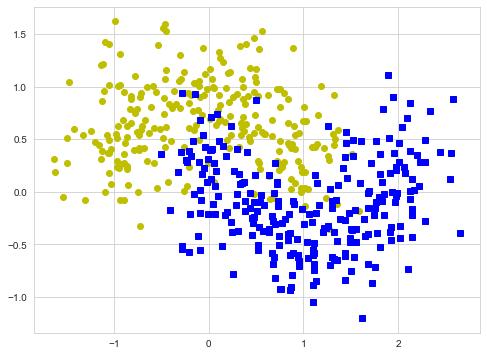

In [17]:
X, y = datasets.make_moons(n_samples=500, noise=0.30, random_state=SEED)

plt.figure(figsize=(8, 6))
plt.plot(X[:, 0][y==0], X[:, 1][y==0], "yo")
plt.plot(X[:, 0][y==1], X[:, 1][y==1], "bs")
plt.show()

In [5]:
## ENTER YOUR CODE HERE (/¯◡ ‿ ◡)/¯☆*##

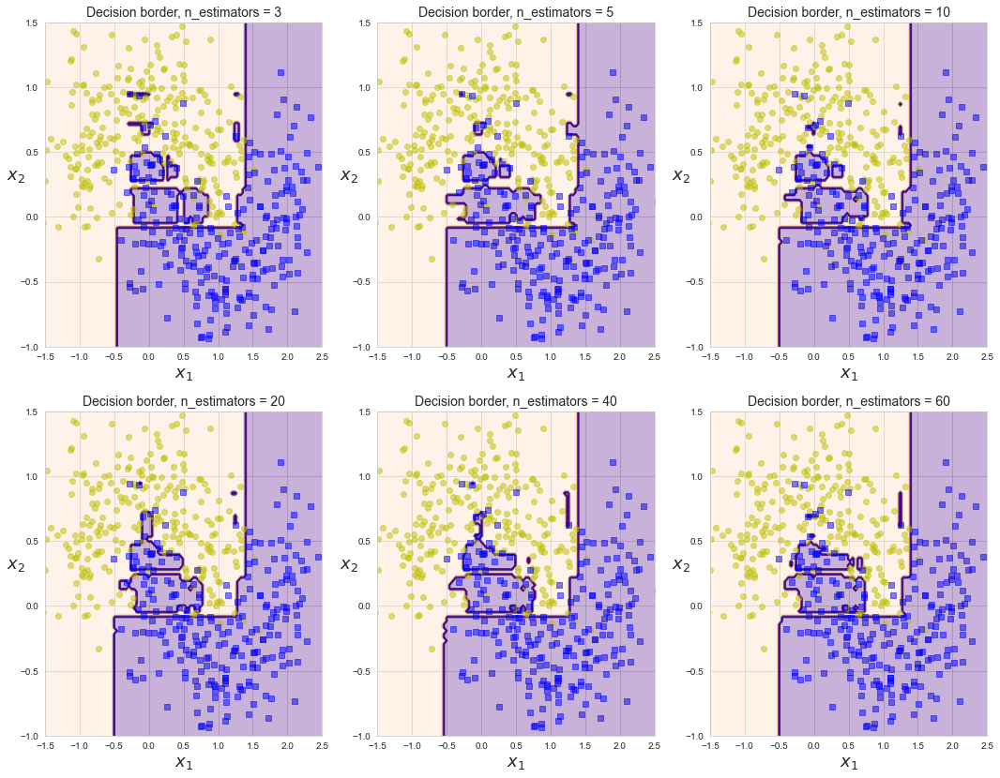

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf0 = RandomForestClassifierCustom(n_estimators=3)
clf0.fit(X_train, y_train)

clf1 = RandomForestClassifierCustom(n_estimators=5)
clf1.fit(X_train, y_train)

clf2 = RandomForestClassifierCustom(n_estimators=10)
clf2.fit(X_train, y_train)

clf3 = RandomForestClassifierCustom(n_estimators=20)
clf3.fit(X_train, y_train)

clf4 = RandomForestClassifierCustom(n_estimators=40)
clf4.fit(X_train, y_train)

clf5 = RandomForestClassifierCustom(n_estimators=60)
clf5.fit(X_train, y_train)

plt.figure(figsize=(18, 14))
plt.subplot(231)
plot_decision_boundary(clf0, X, y)
plt.title("Decision border, n_estimators = 3", fontsize=14)

plt.subplot(232)
plot_decision_boundary(clf1, X, y)
plt.title("Decision border, n_estimators = 5", fontsize=14)

plt.subplot(233)
plot_decision_boundary(clf2, X, y)
plt.title("Decision border, n_estimators = 10", fontsize=14)

plt.subplot(234)
plot_decision_boundary(clf3, X, y)
plt.title("Decision border, n_estimators = 20", fontsize=14)

plt.subplot(235)
plot_decision_boundary(clf4, X, y)
plt.title("Decision border, n_estimators = 40", fontsize=14)

plt.subplot(236)
plot_decision_boundary(clf5, X, y)
plt.title("Decision border, n_estimators = 60", fontsize=14)

plt.show()

Подберите наилучшие гиперпараметры, при которых разделяющая граница будет, на ваш взгляд, оптимальной с точки зрения bias-variance. Можно также подключить какие-то метрики для выбора лучшей модели.

In [118]:
# Найдем лучшие параметры с помощью GridSearchCV и посмотрим на картинку

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [20]:
parameters = {'max_depth' : [None, 1,2,5,7,10,20,30],
             'n_estimators' : [3,5,7,10,20,30,40,50,100],
             'max_features' : [None,1]}

In [22]:
grid = GridSearchCV(RandomForestClassifierCustom(),parameters,scoring=('roc_auc', 'f1', 'accuracy'), refit='roc_auc',
                      n_jobs=8)
grid.fit(X_train,y_train)

GridSearchCV(estimator=RandomForestClassifierCustom(), n_jobs=8,
             param_grid={'max_depth': [None, 1, 2, 5, 7, 10, 20, 30],
                         'max_features': [None, 1],
                         'n_estimators': [3, 5, 7, 10, 20, 30, 40, 50, 100]},
             refit='roc_auc', scoring=('roc_auc', 'f1', 'accuracy'))

In [23]:
grid.best_score_

0.9689956035618522

In [24]:
grid.best_params_

{'max_depth': 5, 'max_features': None, 'n_estimators': 7}

In [25]:
clf = RandomForestClassifierCustom(max_depth=5, n_estimators=7)
clf.fit(X_train, y_train)


RandomForestClassifierCustom(max_depth=5, n_estimators=7)

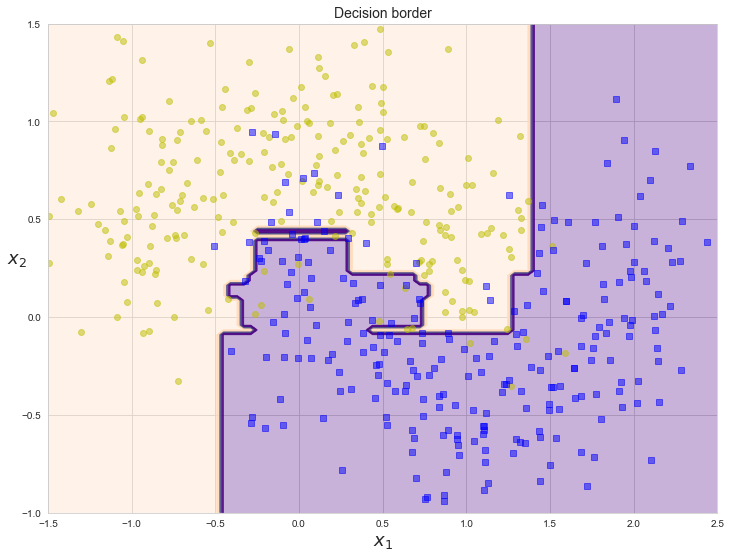

In [26]:
#plt.figure(figsize=(8, 6))
plot_decision_boundary(clf, X, y)
plt.title("Decision border", fontsize=14)
plt.show()

In [27]:
pred = clf.predict(X_test)

In [28]:
accuracy_score(y_test,pred)

0.888

In [29]:
f1_score(y_test,pred)

0.8985507246376812

In [119]:
# Нормальная картинка и хорошие скоры)

#### Задание 2. 3. Корреляция базовых моделей

**3 балла**

Как мы выянили на лекции, для того, чтобы bagging работал хорошо, предсказания наших моделей не должны сильно коррелировать. Для этого в случайном лесе применяются различные подходы, в том числе и RSM. Давайте посмотрим, как влияет параметр `max_features` на корреляцию базовых моделей в случайном лесу из `sklearn`. В качестве примера будем использовать датасет `breast_cancer`. Для расчета корреляций используйте приведенную ниже функцию `base_model_pair_correlation`. Для каждой модели у вас будет получаться набор значений (попарные корреляции всех деревьев), дальше можно изобразить их в виде боксплотов, как мы на лекции рисовали распределение метрик.

In [30]:
# Функция для расчета попарных корреляций базовых моделей в случайном лесу
def base_model_pair_correlation(ensemble, X):
    corrs = []
    for (i, est1), (j, est2) in combinations(enumerate(ensemble.estimators_), 2):
        Xi_test = X
        Xj_test = X

        ypred_t1 = est1.predict_proba(Xi_test)[:, 1]
        ypred_t2 = est2.predict_proba(Xj_test)[:, 1]

        corrs.append(pearsonr(ypred_t1, ypred_t2)[0])
    return np.array(corrs)

In [31]:
# Загрузим данные
breast_cancer = datasets.load_breast_cancer()
X = breast_cancer.data
y = breast_cancer.target
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [6]:
## ENTER YOUR CODE HERE (/¯◡ ‿ ◡)/¯☆*##

In [32]:
data = pd.DataFrame()

In [34]:
max_features = range(1,30,2)
for i in max_features:
    forest = RandomForestClassifier(max_features= i, n_jobs=8).fit(X_train,y_train)
    data[i] = base_model_pair_correlation(forest,X)

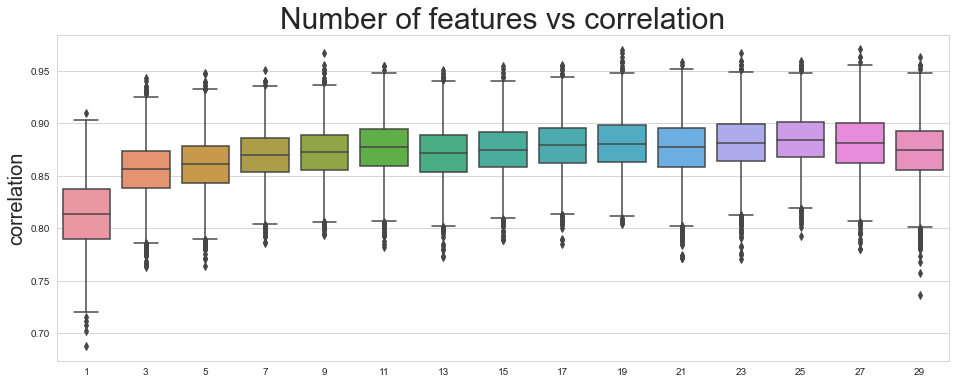

In [35]:
plt.figure(figsize=(16,6))
sns.boxplot(data=data)


plt.ylabel("correlation", size=20)
plt.title("Number of features vs correlation", size=30)
plt.show()

Теперь давайте посмотрим, как на это влияет параметр `max_depth`:

In [7]:
## ENTER YOUR CODE HERE (/¯◡ ‿ ◡)/¯☆*##

In [36]:
data = pd.DataFrame()

In [37]:
max_depth = [1,3,5,6,7,8,9,10,15,20,25,None]
for i in max_depth:
    forest = RandomForestClassifier(max_depth= i,n_jobs=8).fit(X_train,y_train)
    data[i] = base_model_pair_correlation(forest,X)

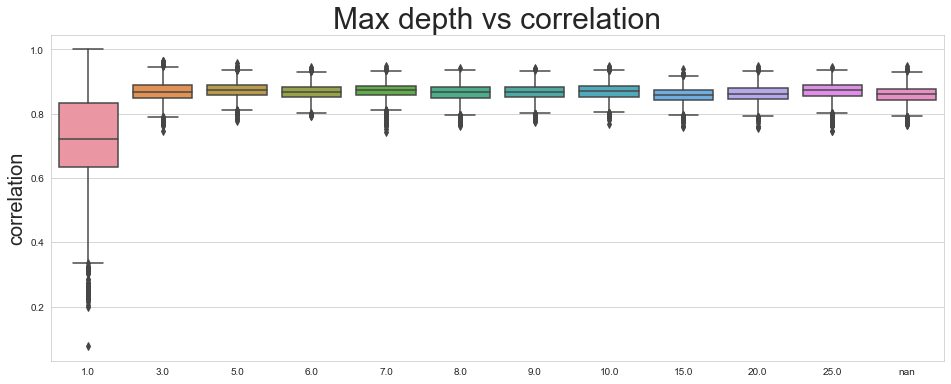

In [38]:
plt.figure(figsize=(16,6))
sns.boxplot(data=data)

#plt.xlabel("max_features = auto", size=20)
plt.ylabel("correlation", size=20)
plt.title("Max depth vs correlation", size=30)
plt.show()

Опишите ваши наблюдения:

* Чем больше max_features и max_depth, тем сильнее корреляция между показаниями базовых моделей (но она быстро выходит на плато)
* ...

### Задание 3. Строим большой ансамбль

**4 балла + 3 дополнительных за эксперименты и максимально высокий скор**

В данной задаче вам нужно диагностировать сердечное заболевание у людей по [медицинским показателям](https://www.kaggle.com/ronitf/heart-disease-uci).

In [39]:
heart_dataset = pd.read_csv(join(DATA_PATH,"heart.csv"))

In [40]:
X = heart_dataset.drop("target", axis=1)
y = heart_dataset["target"]
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=SEED)
X_train.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
178,43,1,0,120,177,0,0,120,1,2.5,1,0,3
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3
201,60,1,0,125,258,0,0,141,1,2.8,1,1,3
246,56,0,0,134,409,0,0,150,1,1.9,1,2,3
153,66,0,2,146,278,0,0,152,0,0.0,1,1,2


Обучите разнообразные классификаторы, приведенные ниже, а также ансамбль `VotingClassifier` из `sklearn.ensemble`, объединяющий эти классификаторы с помощью жесткого или мякого голосования (параметр `voting =` `'hard'` или `'soft'` соответственно). Оцените качество моделей с помощью кросс-валидации на тренировочном наборе, используя функцию `cross_val_score` и метрику `f1`. Часть моделей отсюда мы не проходили, о них можно почитать дополнительно, но в принципе для задания не очень важно знать принципы их работы (но, если есть время, то почитайте, там интересно).

In [44]:
dt = DecisionTreeClassifier(random_state=SEED, max_depth=10, min_samples_leaf=10)
rf = RandomForestClassifier(n_estimators=50, random_state=SEED)
etc = ExtraTreesClassifier(random_state=SEED)
knn = KNeighborsClassifier(n_neighbors=5, weights="distance")
svc_lin = SVC(kernel='linear', probability=True, random_state=SEED)
svc_rbf = SVC(kernel='rbf', probability=True, random_state=SEED)
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
lgbm = lightgbm.LGBMClassifier(random_state=SEED)
lgbm_rf = lightgbm.LGBMClassifier(boosting_type="rf", bagging_freq=1, bagging_fraction=0.7, random_state=SEED)
xgb = xgboost.XGBClassifier(random_state=SEED)
xgb_rf = xgboost.XGBRFClassifier(random_state=SEED)
lr = LogisticRegression(solver='liblinear', max_iter=10000)
nb = GaussianNB()

base_models = [("DT", dt), ("RF", rf), 
               ("ETC", etc), ("KNN", knn), 
               ("SVC_LIN", svc_lin), ("SVC_RBF", svc_rbf), 
               ("CAT", cat), ("LGBM", lgbm), 
               ("LGBM_RF", lgbm_rf), ("XGB", xgb), 
               ("XGB_RF", xgb_rf), ("LR", lr), ("NB", nb)]



Здесь могут возникать различные предупреждения при обучении бустингов, не волнуйтесь, все нормально, просто они обычно очень разговорчивые)

In [45]:
## ENTER YOUR CODE HERE (/¯◡ ‿ ◡)/¯☆*##
voting_hard = VotingClassifier(base_models, voting="hard")
voting_hard.fit(X_train, y_train)
voting_soft = VotingClassifier(base_models, voting="soft")
voting_soft.fit(X_train, y_train)
## END YOUR CODE HERE ##
for model in [dt, rf, cat, etc, knn, svc_lin, svc_rbf, xgb, lgbm, xgb_rf, lgbm_rf, lr, nb]:
    model.fit(X_train, y_train)

table= pd.DataFrame({'model_name': [], 'score':[]})
for model in [dt, rf, cat, etc, knn, svc_lin, svc_rbf, xgb, lgbm, xgb_rf, lgbm_rf, lr, nb, voting_hard, voting_soft]: 
    scores = cross_val_score(model, X_train, y_train, cv=3, scoring="f1")
    table.loc[len(table)] = [model.__class__.__name__, scores.mean()]
    #print(f"{model.__class__.__name__}: {scores.mean()}")

[20:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [46]:
table

,model_name,score
0,DecisionTreeClassifier,0.797997
1,RandomForestClassifier,0.832875
2,CatBoostClassifier,0.834272
3,ExtraTreesClassifier,0.828175
4,KNeighborsClassifier,0.649331
5,SVC,0.840310
6,SVC,0.697312
7,XGBClassifier,0.820158
8,LGBMClassifier,0.817011
9,XGBRFClassifier,0.837963


Вы можете заметить, что ансамбль показывает хорошее, но не лучшее качество предсказания, попробуем его улучшить. Как вы знаете, ансамбли работают лучше, когда модели, входящие в них не скоррелированы друг с другом. Определите корреляцию предсказаний базовых моделей в ансамбле на тестовом наборе данных, и удалите из ансамбля те модели, чьи предсказания будут сильнее коррелировать с остальными. Воспользуйтесь функцией `base_model_pair_correlation_for_voting_clf`. **Спойлер**: далеко не факт, что если вы удалите две модели с корреляцией 0.95, то все станет сильно лучше, здесь все будет немного сложнее. Чтобы добиться максимального качества может понадобиться долгий перебор различных комбинаций моделей. Наилучший скор, который мне удалось достичь, это 0.915, но он получен весьма странной комбинацией алгоритмов, а еще и простым перебором всех вариантов)

In [47]:
def base_model_pair_correlation_for_voting_clf(ensemble, X):
    corrs = []
    base_model_names = [f"{est.__class__.__name__}" for est in ensemble.estimators_]
    for (i, est1), (j, est2) in combinations(enumerate(ensemble.estimators_), 2):
        Xi_test = X
        Xj_test = X

        if not isinstance(est1, SVC):
            ypred_t1 = est1.predict_proba(Xi_test)[:, 1]
        else:
            ypred_t1 = est1.decision_function(Xi_test)


        if not isinstance(est2, SVC):
            ypred_t2 = est2.predict_proba(Xi_test)[:, 1]
        else:
            ypred_t2 = est2.decision_function(Xi_test)
        corrs.append((est1, est2, pearsonr(ypred_t1, ypred_t2)[0]))


    return corrs

In [9]:
## ENTER YOUR CODE HERE (/¯◡ ‿ ◡)/¯☆*##

In [48]:
c = base_model_pair_correlation_for_voting_clf(voting_soft,X)

In [49]:
corr_table = np.ones((13,13))

In [50]:
# строим таблицу корреляций
start = 1
pos = -1
for i in range(13):
    
    for j in range(start, 13):
        corr_table[i][j] = np.around(c[j + pos][2],2)
        corr_table[j][i] = np.around(c[j + pos][2],2)
    start +=1
    pos += 11 - i

In [51]:
d = pd.DataFrame(corr_table, columns=["dt","rf", "etc", "knn","svc_lin", "svc_rbf", 
                                      "cat", "lgbm", "lgbm_rf", "xgb", "xgb_rf", "lr", "nb"],
                index = ["dt","rf", "etc", "knn","svc_lin", "svc_rbf", "cat", "lgbm", "lgbm_rf", "xgb", "xgb_rf", "lr", "nb"])

In [52]:
d

,dt,rf,etc,knn,svc_lin,svc_rbf,cat,lgbm,lgbm_rf,xgb,xgb_rf,lr,nb
dt,1.00,0.86,0.79,0.74,0.81,0.50,0.86,0.86,0.91,0.83,0.93,0.84,0.76
rf,0.86,1.00,0.97,0.91,0.82,0.51,0.98,0.97,0.87,0.97,0.96,0.84,0.80
etc,0.79,0.97,1.00,0.94,0.74,0.44,0.97,0.96,0.78,0.97,0.91,0.76,0.72
knn,0.74,0.91,0.94,1.00,0.66,0.46,0.89,0.89,0.72,0.90,0.85,0.68,0.63
svc_lin,0.81,0.82,0.74,0.66,1.00,0.53,0.83,0.81,0.88,0.77,0.84,0.96,0.88
svc_rbf,0.50,0.51,0.44,0.46,0.53,1.00,0.49,0.46,0.55,0.44,0.52,0.57,0.54
cat,0.86,0.98,0.97,0.89,0.83,0.49,1.00,0.99,0.87,0.98,0.97,0.86,0.81
lgbm,0.86,0.97,0.96,0.89,0.81,0.46,0.99,1.00,0.85,0.99,0.96,0.83,0.77
lgbm_rf,0.91,0.87,0.78,0.72,0.88,0.55,0.87,0.85,1.00,0.82,0.92,0.88,0.82
xgb,0.83,0.97,0.97,0.90,0.77,0.44,0.98,0.99,0.82,1.00,0.95,0.80,0.73


In [53]:
# считаем среднюю корреляцию для каждой модели с другими моделями.
cor_mean = np.array([corr_table.mean(axis = 1)])
lab = np.array([["dt","rf", "etc", "knn","svc_lin", "svc_rbf", "cat", "lgbm", "lgbm_rf", "xgb", "xgb_rf", "lr", "nb"]])
cor_mean = np.hstack((lab.T, cor_mean.T))

In [54]:
cor_mean 

array([['dt', '0.8223076923076923'],
       ['rf', '0.8815384615384616'],
       ['etc', '0.8423076923076924'],
       ['knn', '0.7899999999999999'],
       ['svc_lin', '0.8099999999999999'],
       ['svc_rbf', '0.5392307692307693'],
       ['cat', '0.8846153846153846'],
       ['lgbm', '0.8723076923076921'],
       ['lgbm_rf', '0.8361538461538462'],
       ['xgb', '0.8576923076923078'],
       ['xgb_rf', '0.8838461538461538'],
       ['lr', '0.8315384615384614'],
       ['nb', '0.783846153846154']], dtype='<U32')

In [55]:
# Удаляем модели корреляцией >0.85 : ("RF", rf),("CAT", cat),("LGBM", lgbm),("XGB_RF", xgb_rf),("XGB", xgb),

In [56]:
base_models2 = [("DT", dt),  
               ("ETC", etc), ("KNN", knn), 
               ("SVC_LIN", svc_lin), ("SVC_RBF", svc_rbf), 
                 
               ("LGBM_RF", lgbm_rf),  
                ("LR", lr), ("NB", nb)]

In [57]:
voting_soft2 = VotingClassifier(base_models2, voting="soft")
scores = cross_val_score(voting_soft2, X_train, y_train, cv=3, scoring="f1")
print(f"{model.__class__.__name__}: {scores.mean()}")

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
VotingClassifier: 0.8345377241055983


In [58]:
# минус 2 самые большие ("CAT", cat),("XGB_RF", xgb_rf),

In [59]:
base_models3 = [("DT", dt), ("RF", rf), 
               ("ETC", etc), ("KNN", knn), 
               ("SVC_LIN", svc_lin), ("SVC_RBF", svc_rbf), 
                ("LGBM", lgbm), 
               ("LGBM_RF", lgbm_rf), ("XGB", xgb), 
                ("LR", lr), ("NB", nb)]



In [60]:
voting_soft3 = VotingClassifier(base_models3, voting="soft")
scores = cross_val_score(voting_soft3, X_train, y_train, cv=3, scoring="f1")
print(f"{model.__class__.__name__}: {scores.mean()}")

[20:35:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
VotingClassifier: 0.8455110375195781


In [61]:
# минус 2 самые большие и 2 средние ("CAT", cat),("XGB_RF", xgb_rf),("KNN", knn),("NB", nb),

In [62]:
base_models4 = [("DT", dt), ("RF", rf), 
               ("ETC", etc),  
               ("SVC_LIN", svc_lin), ("SVC_RBF", svc_rbf), 
                ("LGBM", lgbm), 
               ("LGBM_RF", lgbm_rf), ("XGB", xgb), 
                ("LR", lr) ]

In [63]:
voting_soft4 = VotingClassifier(base_models4, voting="soft")
scores = cross_val_score(voting_soft4, X_train, y_train, cv=3, scoring="f1")
print(f"{model.__class__.__name__}: {scores.mean()}")

[20:35:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
VotingClassifier: 0.853949856084979


In [64]:
# минус 2 самые большие и 3 средние ("CAT", cat),("XGB_RF", xgb_rf),("KNN", knn),("NB", nb),("SVC_LIN", svc_lin),

In [65]:
base_models5 = [("DT", dt), ("RF", rf), 
               ("ETC", etc),  
                ("SVC_RBF", svc_rbf), 
                ("LGBM", lgbm), 
               ("LGBM_RF", lgbm_rf), ("XGB", xgb), 
                ("LR", lr) ]

In [66]:
voting_soft5 = VotingClassifier(base_models5, voting="soft")
scores = cross_val_score(voting_soft5, X_train, y_train, cv=3, scoring="f1")
print(f"{model.__class__.__name__}: {scores.mean()}")

[20:35:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
VotingClassifier: 0.8503633581946834


In [67]:
# вернем одну большую : минус ("XGB_RF", xgb_rf),("KNN", knn),("NB", nb), 0.8576283154596407

In [68]:
base_models6 = [("DT", dt), ("RF", rf), 
               ("ETC", etc), ("CAT", cat), 
               ("SVC_LIN", svc_lin), ("SVC_RBF", svc_rbf), 
                ("LGBM", lgbm), 
               ("LGBM_RF", lgbm_rf), ("XGB", xgb), 
                ("LR", lr) ]

In [69]:
voting_soft6 = VotingClassifier(base_models6, voting="soft")
scores = cross_val_score(voting_soft6, X_train, y_train, cv=3, scoring="f1")
print(f"{model.__class__.__name__}: {scores.mean()}")

[20:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:36:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:36:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
VotingClassifier: 0.8576283154596407


In [70]:
#минус ("XGB_RF", xgb_rf),("KNN", knn),("ETC", etc), 0.8503633581946834

In [71]:
#минус ("XGB_RF", xgb_rf),("KNN", knn),("ETC", etc),("LR", lr), 0.8471887550200803

In [72]:
#минус ("XGB_RF", xgb_rf),("KNN", knn),("NB", nb),("LGBM", lgbm), 0.8547619047619047

In [73]:
#минус ("XGB_RF", xgb_rf),("KNN", knn),("NB", nb),("LGBM", lgbm),("SVC_RBF", svc_rbf), 0.8630952380952381

In [74]:
#минус ("XGB_RF", xgb_rf),("KNN", knn),("NB", nb),("SVC_RBF", svc_rbf), 0.862026862026862

In [75]:
# просто удалим каждую вторую))) : 0.8659318048206938 

In [76]:
# просто удалим каждую первую))) :0.8455110375195781

In [77]:
# Все 0.8395804737268152
# - ("RF", rf), 0.8453489599831063
# - ("XGB_RF", xgb_rf),  0.8527055600226333
# - ("LGBM", lgbm), 0.8527055600226333
# - ("CAT", cat), 0.8549771902012401
# - ("ETC", etc), 0.852145796590241
# -("LR", lr),0.8429698708751793
# - ("XGB", xgb), 0.8327342747111682

In [78]:
# попробуем просто перебрать!

In [79]:
model_score = []
for i in range(2,12):
    models = list(itertools.combinations(base_models,i))
    for model in models:
        voting_soft_comb = VotingClassifier(model, voting="soft")
        scores = cross_val_score(voting_soft_comb, X_train, y_train, cv=3, scoring="f1")
        mean = scores.mean()
        model_score.append((model,mean))
        if mean >= 0.915:
            print(model, "score", mean)
            break
    if mean >= 0.915:
        break

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[20:36:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:36:38] WARN

KeyboardInterrupt: 

In [80]:
len(model_score)

7181

In [91]:
arr = np.array(model_score)

In [94]:
np.amax(arr[:,1])

0.8735332529636327

In [95]:
np.argmax(arr[:,1])

840

In [96]:
arr[840]

array([(('ETC', ExtraTreesClassifier(random_state=111)), ('CAT', <catboost.core.CatBoostClassifier object at 0x000001D1F9CEDAB0>), ('LGBM_RF', LGBMClassifier(bagging_fraction=0.7, bagging_freq=1, boosting_type='rf',
                      random_state=111)), ('XGB_RF', XGBRFClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                       colsample_bytree=1, enable_categorical=False, gamma=0,
                       gpu_id=-1, importance_type=None, interaction_constraints='',
                       max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
                       monotone_constraints='()', n_estimators=100, n_jobs=8,
                       num_parallel_tree=100, objective='binary:logistic',
                       predictor='auto', random_state=111, reg_alpha=0,
                       scale_pos_weight=1, tree_method='exact', validate_parameters=1,
                       verbosity=None)))                                                           

In [ ]:
#ну вот, за 4 часа перебора это лучшая модель, и всего 1000 недосчитали(

In [101]:
model_score2 = []
for i in range(9,12):
    models = list(itertools.combinations(base_models,i))
    for model in models:
        voting_soft_comb2 = VotingClassifier(model, voting="soft")
        scores = cross_val_score(voting_soft_comb2, X_train, y_train, cv=3, scoring="f1")
        mean = scores.mean()
        model_score2.append((model,mean))
        if mean >= 0.915:
            print(model, "score", mean)
            break
    if mean >= 0.915:
        break

[01:19:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:19:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:19:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:19:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [102]:
len(model_score2)

1079

In [103]:
arr2 = np.array(model_score2)

In [106]:
np.amax(arr2[:,1])

0.8662849105887082

In [107]:
np.argmax(arr2[:,1])

295

In [109]:
arr2[295]

array([(('DT', DecisionTreeClassifier(max_depth=10, min_samples_leaf=10, random_state=111)), ('RF', RandomForestClassifier(n_estimators=50, random_state=111)), ('SVC_LIN', SVC(kernel='linear', probability=True, random_state=111)), ('SVC_RBF', SVC(probability=True, random_state=111)), ('CAT', <catboost.core.CatBoostClassifier object at 0x000001D1F9CEDAB0>), ('LGBM', LGBMClassifier(random_state=111)), ('LGBM_RF', LGBMClassifier(bagging_fraction=0.7, bagging_freq=1, boosting_type='rf',
                      random_state=111)), ('XGB', XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                     colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
                     gamma=0, gpu_id=-1, importance_type=None,
                     interaction_constraints='', learning_rate=0.300000012,
                     max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
                     monotone_constraints='()', n_estimators=100, n_jobs=8,
      

In [110]:
arr[840]

array([(('ETC', ExtraTreesClassifier(random_state=111)), ('CAT', <catboost.core.CatBoostClassifier object at 0x000001D1F9CEDAB0>), ('LGBM_RF', LGBMClassifier(bagging_fraction=0.7, bagging_freq=1, boosting_type='rf',
                      random_state=111)), ('XGB_RF', XGBRFClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                       colsample_bytree=1, enable_categorical=False, gamma=0,
                       gpu_id=-1, importance_type=None, interaction_constraints='',
                       max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
                       monotone_constraints='()', n_estimators=100, n_jobs=8,
                       num_parallel_tree=100, objective='binary:logistic',
                       predictor='auto', random_state=111, reg_alpha=0,
                       scale_pos_weight=1, tree_method='exact', validate_parameters=1,
                       verbosity=None)))                                                           

In [111]:
# за 5 часов перебора эта модель оказалась лучшей)

### Задание 4. Определение оттока клиентов из телекома

**6 баллов + 7 дополнительных за высокое качество модели и различные эксперименты**

Будем предсказывать, уйдет ли от нас клиент (переменная `Churn?`). Данные можно скачать [здесь](https://www.kaggle.com/venky12347/churn-telecom). Это будет уже совсем взрослое задание, так как правильного ответа на него нет. Вам нужно будет разобраться с данными, правильно подготовить их для моделей, а также выбрать лучшую модель. 

Задача минимум:

Выберите 2 модели &mdash; один случайный лес и один бустинг из приведенных ниже:

1. `xgboost.XGBClassifier`
2. `xgboost.XGBRFClassifier` &mdash; случайный лес от xgboost
3. `lightgbm.LGBMClassifier`
4. `lightgbm.LGBMClassifier(boosting_type="rf")` &mdash; случайный лес от lightgbm
5. `catboost.CatBoostClassifier`

И попробуйте разобраться с тем, как для этих моделей правильно настраивать гиперпараметры. Советую гуглить примерно следующее `how to choose best hyperparameters for lightgbm`. Там вы найдете кучу сложного и непонятного кода, но если с ним разобраться и научиться обучать нестандартные бустинги, то в плане табличных данных равных вам не будет)

In [118]:
# Выберем:
# xgboost.XGBClassifier
# lightgbm.LGBMClassifier(boosting_type="rf")

In [3]:
data = pd.read_csv(join(DATA_PATH,"churn.csv"))
data.head()

,State,Account Length,Area Code,Phone,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,...,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn?
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [4]:
data.shape

(3333, 21)

In [5]:
data.describe()

,Account Length,Area Code,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [6]:
data.dtypes

State              object
Account Length      int64
Area Code           int64
Phone              object
Int'l Plan         object
VMail Plan         object
VMail Message       int64
Day Mins          float64
Day Calls           int64
Day Charge        float64
Eve Mins          float64
Eve Calls           int64
Eve Charge        float64
Night Mins        float64
Night Calls         int64
Night Charge      float64
Intl Mins         float64
Intl Calls          int64
Intl Charge       float64
CustServ Calls      int64
Churn?             object
dtype: object

In [7]:
data["Int'l Plan"].value_counts()

no     3010
yes     323
Name: Int'l Plan, dtype: int64

In [8]:
data["VMail Plan"].value_counts()

no     2411
yes     922
Name: VMail Plan, dtype: int64

In [9]:
data["Churn?"].value_counts()

False.    2850
True.      483
Name: Churn?, dtype: int64

In [10]:
data.isna().sum()  # посчитаем количество пропущенных значений в каждом столбце

State             0
Account Length    0
Area Code         0
Phone             0
Int'l Plan        0
VMail Plan        0
VMail Message     0
Day Mins          0
Day Calls         0
Day Charge        0
Eve Mins          0
Eve Calls         0
Eve Charge        0
Night Mins        0
Night Calls       0
Night Charge      0
Intl Mins         0
Intl Calls        0
Intl Charge       0
CustServ Calls    0
Churn?            0
dtype: int64

In [11]:
#обработаем строковые данные
data["Int'l Plan"] = np.where(data["Int'l Plan"] == 'no', 0,1)
data["VMail Plan"] = np.where(data["VMail Plan"] == 'no', 0,1)
data["Churn?"] = np.where(data["Churn?"] == 'False.', 0,1) 



In [12]:
data=data.rename(columns={"Int'l Plan":"Intl Plan"})

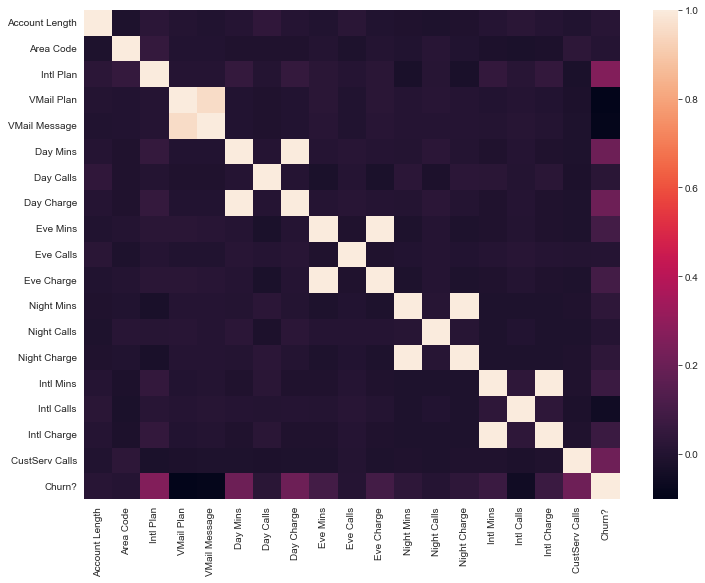

In [13]:
hm = sns.heatmap(data.corr(),
                 cbar=True,
                 annot=False)

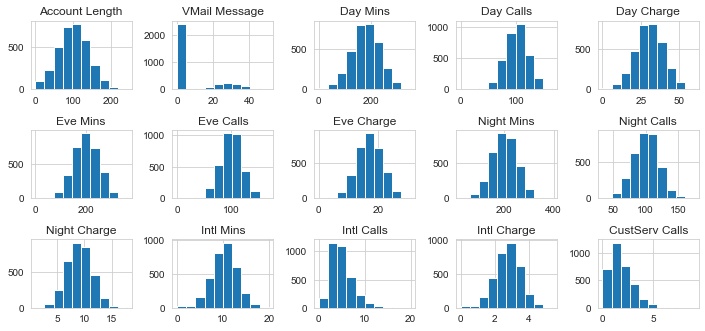

In [14]:
plot_data = data.drop(["State","Area Code","Phone",'Churn?', 'Intl Plan', 'VMail Plan'], axis=1)
plt.figure(figsize=(10, 6))
for i in range(plot_data.shape[1]):
    plt.subplot(4, 5, i+1)
    plt.tight_layout()
    plt.hist(x=plot_data.iloc[:,[i]])
    plt.title(plot_data.columns[i])
plt.show()

In [320]:
# Удалим колонки с названием штата, кодом города и номером телефона

In [15]:
data_prepr = data.drop(["State","Area Code","Phone"], axis=1) 

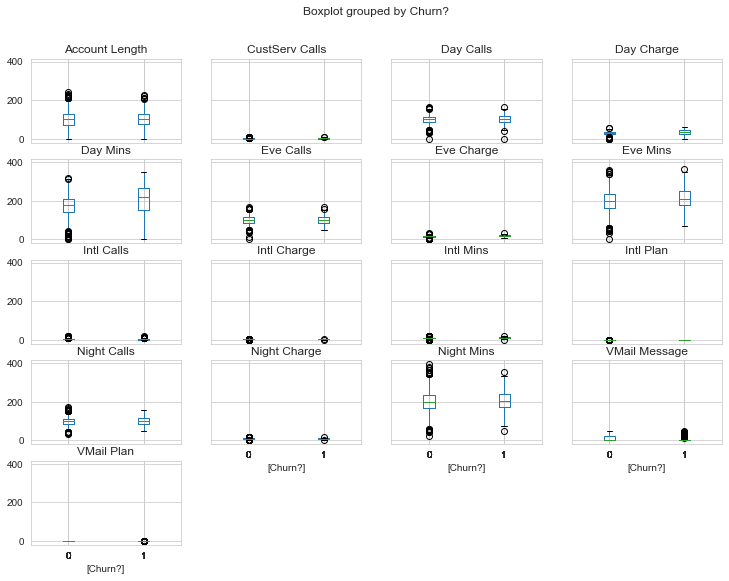

In [16]:
data_prepr.boxplot(by='Churn?');

In [37]:
# EDA и подготовка закончена

In [17]:
X = data_prepr.drop(columns='Churn?')
y= data_prepr["Churn?"]

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=SEED)

In [19]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

In [20]:
space={'max_depth': hp.quniform("max_depth", 3, 10, 1),
       'learning_rate' : hp.uniform('learning_rate', 0.01,2),
        'gamma': hp.uniform ('gamma', 0,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform('n_estimators', 2, 200, 1),
        'seed': SEED
    }

In [21]:
def objective(space):
    clf=xgboost.XGBClassifier(n_estimators = int(space['n_estimators']),
                    learning_rate=space['learning_rate'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    min_child_weight=int(space['min_child_weight']),reg_alpha = int(space['reg_alpha']),
                    colsample_bytree=int(space['colsample_bytree']))
    
    evaluation = [( X_train, y_train), ( X_test, y_test)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)
    

    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred)
    #print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

In [22]:
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 1000,
                        trials = trials)

100%|███████████████████████████████████████████| 1000/1000 [02:02<00:00,  8.16trial/s, best loss: -0.8908872901678657]


In [23]:
best_hyperparams

{'colsample_bytree': 0.6718274118349856,
 'gamma': 0.4335974060992324,
 'learning_rate': 1.6292565437243869,
 'max_depth': 6.0,
 'min_child_weight': 0.0,
 'n_estimators': 14.0,
 'reg_alpha': 75.0,
 'reg_lambda': 0.6269364553252044}

In [26]:
model1 = xgboost.XGBClassifier(colsample_bytree = 0.6718274118349856,
 gamma = 0.4335974060992324,
 learning_rate = 1.6292565437243869,
 max_depth = 6,
 min_child_weight = 0,
 n_estimators = 14,
 reg_alpha = 75,
 reg_lambda = 0.6269364553252044)

In [27]:
model1.fit(X_train,y_train)

[17:13:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6718274118349856,
              enable_categorical=False, gamma=0.4335974060992324, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=1.6292565437243869, max_delta_step=0, max_depth=6,
              min_child_weight=0, missing=nan, monotone_constraints='()',
              n_estimators=14, n_jobs=8, num_parallel_tree=1, predictor='auto',
              random_state=0, reg_alpha=75, reg_lambda=0.6269364553252044,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [28]:
model1_pred = model1.predict(X_test)

In [29]:
accuracy_score(y_test,model1_pred)

0.8597122302158273

In [44]:
#lightgbm.LGBMClassifier(boosting_type="rf")

In [30]:
space2 = {
        "n_estimators" : hp.quniform('n_estimators', 1000, 10000, 1),
        'learning_rate' : hp.uniform('learning_rate', 0.01,0.3),
        
        "num_leaves": hp.quniform("num_leaves", 20, 3000, 1),
        'max_depth': hp.quniform("max_depth", 3, 12, 1),
        'reg_alpha' : hp.quniform('reg_alpha', 0, 100,1),
        
        "min_gain_to_split": hp.uniform("min_gain_to_split", 0, 15),
   
        "bagging_fraction": hp.uniform("bagging_fraction", 0.2, 0.95),
           
        "bagging_freq": 1,
        "feature_fraction": hp.uniform("feature_fraction", 0.2, 0.95)}

In [31]:
def objective2(space2):
    clf= lightgbm.LGBMClassifier(boosting_type="rf", n_estimators=int(space2['n_estimators']), 
                                 learning_rate=space2['learning_rate'], num_leaves = int(space2['num_leaves']),
                                max_depth = int(space2['max_depth']), reg_alpha = int(space2['reg_alpha']), 
                                 min_gain_to_split = space2['min_gain_to_split'], bagging_fraction = space2['bagging_fraction'],
                                bagging_freq = int(space2['bagging_freq']), feature_fraction = space2['feature_fraction'])
    
   
    clf.fit(X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="accuracy",
            early_stopping_rounds=100,verbose = -1)
    

    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred)
    #print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

In [32]:
trials2 = Trials()

best_hyperparams2 = fmin(fn = objective2,
                        space = space2,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials2)

[LightGBM] [Warning] feature_fraction is set=0.8470707645940261, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8470707645940261
[LightGBM] [Warning] min_gain_to_split is set=11.05158020861882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.05158020861882
[LightGBM] [Warning] bagging_fraction is set=0.45774709994268964, subsample=1.0 will be ignored. Current value: bagging_fraction=0.45774709994268964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1            
[LightGBM] [Warning] feature_fraction is set=0.5999709427387754, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5999709427387754
[LightGBM] [Warning] min_gain_to_split is set=2.0939583823567824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0939583823567824
[LightGBM] [Warning] bagging_fraction is set=0.8681852620014048, subsample=1.0 will be ignored. Current value: baggin

In [33]:
best_hyperparams2

{'bagging_fraction': 0.6899688216336725,
 'feature_fraction': 0.93940232911838,
 'learning_rate': 0.21781214137736918,
 'max_depth': 6.0,
 'min_gain_to_split': 0.642109820644631,
 'n_estimators': 9100.0,
 'num_leaves': 2977.0,
 'reg_alpha': 0.0}

In [34]:
lgb = lightgbm.LGBMClassifier(boosting_type="rf", bagging_fraction = 0.6899688216336725,
 feature_fraction = 0.93940232911838,
 learning_rate = 0.21781214137736918,
 max_depth = 6,
 min_gain_to_split = 0.642109820644631,
 n_estimators = 9100,
 num_leaves = 2977,
 reg_alpha = 0, bagging_freq = 1)

In [35]:
lgb.fit(X_train,y_train)

[LightGBM] [Warning] feature_fraction is set=0.93940232911838, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.93940232911838
[LightGBM] [Warning] min_gain_to_split is set=0.642109820644631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.642109820644631
[LightGBM] [Warning] bagging_fraction is set=0.6899688216336725, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6899688216336725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


LGBMClassifier(bagging_fraction=0.6899688216336725, bagging_freq=1,
               boosting_type='rf', feature_fraction=0.93940232911838,
               learning_rate=0.21781214137736918, max_depth=6,
               min_gain_to_split=0.642109820644631, n_estimators=9100,
               num_leaves=2977, reg_alpha=0)

In [36]:
l_pred = lgb.predict(X_test)

In [37]:
accuracy_score(y_test,l_pred)

0.9364508393285371

### Задание 5. Рисуем

**дополнительно 0.5 балла**

Наверняка, в процессе выполнения этого задания вас переполняли какие-то эмоции. Нарисуйте что-то, что бы могло бы передать их (я сам не умею, так что, если это будет просто квадрат, тоже подойдет). Прикрепите сюда свой рисунок:

In [ ]:
## PASTE YOUR MASTERPIECE HERE (/¯◡ ‿ ◡)/¯☆*##

### Therapy time

Напишите здесь ваши впечатления о задании (можно и не о задании): было ли интересно, было ли слишком легко или наоборот сложно и тд. Также сюда можно написать свои идеи по улучшению заданий, а также предложить данные, на основе которых вы бы хотели построить следующие дз.

**Ваши мысли:**